# 1. choose the emulator you wanna use
%specify the name(folder) of the emulator

In [1]:
emul_name="modlowice_precip" #this is the name of the emulator folder
emul_path="../"+emul_name+"/"

# 2. choose the input you wanna predict
%contains the specific number of input vars we need 

In [2]:
#refer to the documentation: 
#Emulator_Charlie/Emulator/2015_Bristol_5D_v001/R/Loading/Emul_in_Temp.R 
# /Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/Results/emul_inputs_natural.Corr.res
# /Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/Results/emul_inputs_RCP26.Corr.res
# /Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/Results/emul_inputs_RCP45.Corr.res
# /Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/Results/emul_inputs_RCP85.Corr.res
prediction_input="/Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/Results/emul_inputs_RCP85.1.res"
prediction_output="prediction_"+emul_name+".RCP85.1.nc"

# date to compare with Charlies'
# /Users/bo20541/Library/CloudStorage/OneDrive-UniversityofBristol/TONIC-Oligocene/Emulator_Charlie/OrigData/Emulator/Output/Em_output_data_temp_Global_*.nc

# Read input and Run prediction.py
# 读取input并且run emulator文件夹下的prediction.py

the 5 variables sum used to standardlize input forcings are:
['co2_mean', 'co2_std', 'obliquity_mean', 'obliquity_std', 'esinw_mean', 'esinw_std', 'ecosw_mean', 'ecosw_std', 'ice_mean', 'ice_std']
finish reading emulator in GP List (GP regression information)
We have the following PCs:
dict_keys(['PC_01', 'PC_02', 'PC_03', 'PC_04', 'PC_05', 'PC_06', 'PC_07', 'PC_08', 'PC_09', 'PC_10', 'PC_11', 'PC_12', 'PC_13', 'PC_14', 'PC_15'])
For each PC in GPList, the GP info used are:
dict_keys(['R', 'R1tX', 'Rt', 'X', 'Y', 'betahat', 'e', 'log_REML', 'log_pen_REML', 'muX', 'sigma_hat_2', 'covar', 'funcmu', 'lambda', 'nbrr', 'regress'])
finish reading emulator in PCA components
For each PCA we have these info:
dict_keys(['mean', 'PCA', 'scaled_amps', 'amps', 'd', 'lat', 'lon'])
We have such many forcings to be predicted: (5, 1001)
The 5 input variable for prediction are:
       0          1         2          3    4
0    co2  obliquity     esinw      ecosw  ice
1  442.8      23.44   0.01628  -0.0

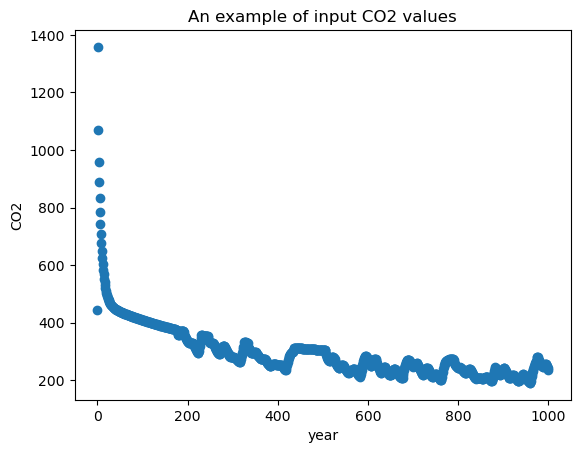

Predicted results include: dict_keys(['mean', 'var', 'means', 'variances'])


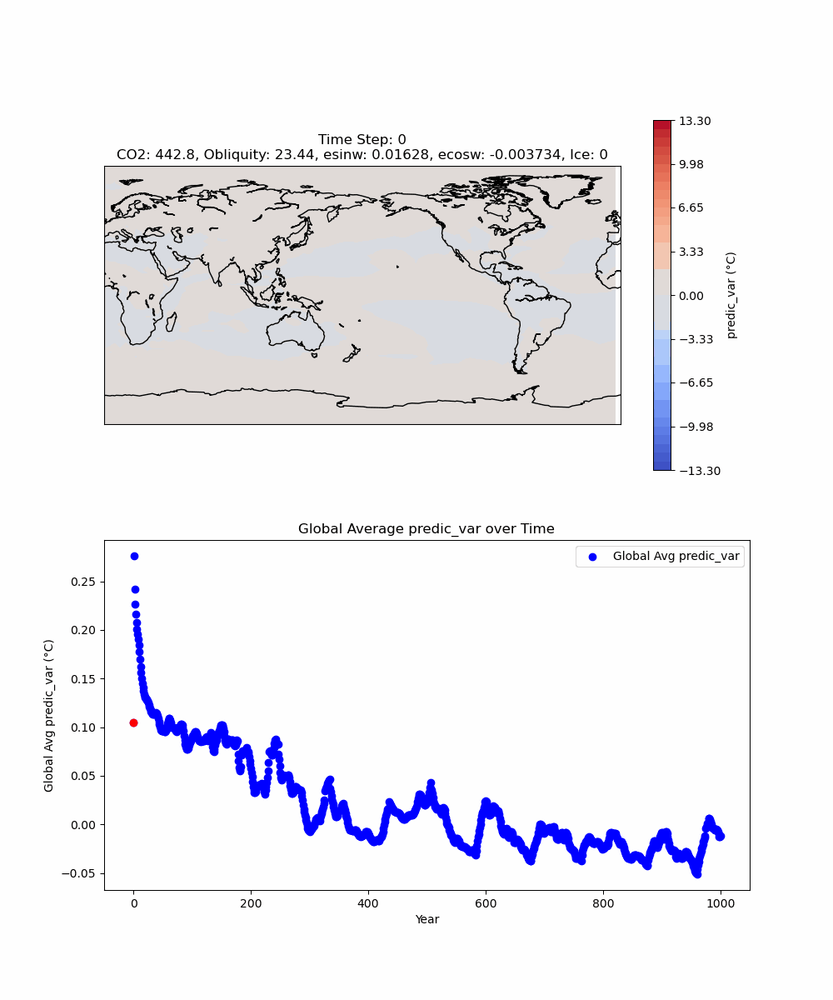

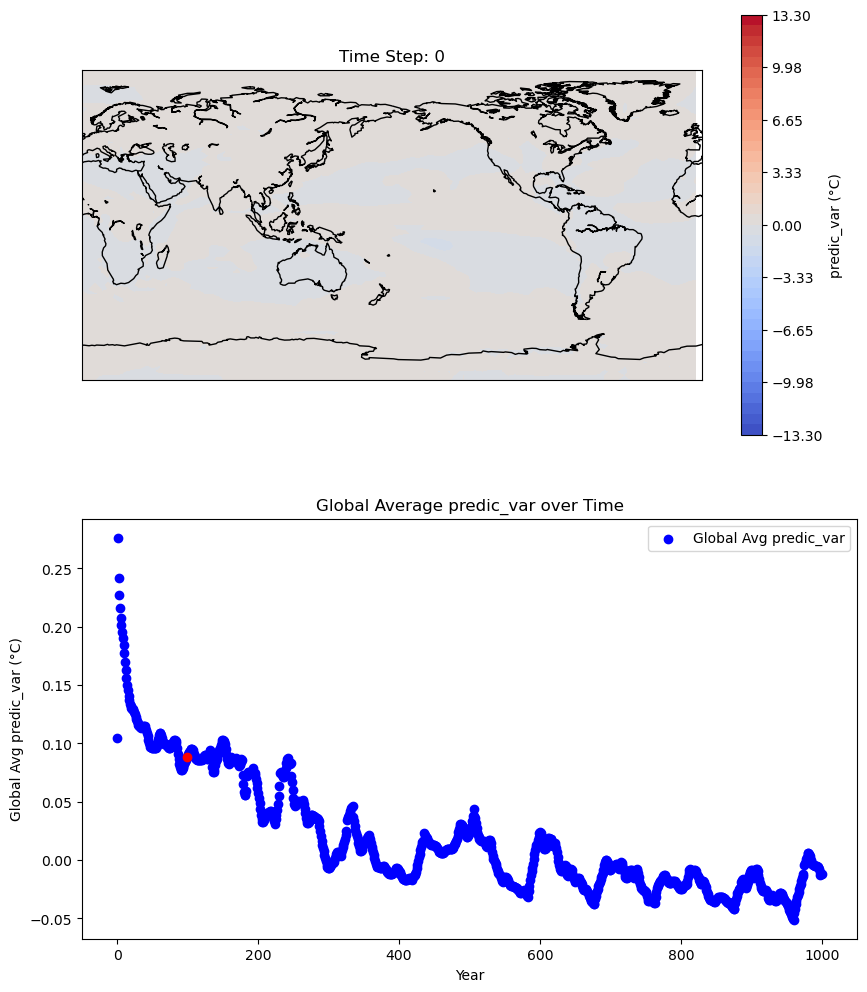

In [3]:
import os
from IPython.display import Image, display

# 临时更改当前工作目录
original_cwd = os.getcwd()  # 保存原工作目录
try:
    os.chdir(emul_path+"core_code/")  # 切换到 core_code 目录

    # 运行 Prediction.py
    exec(open("Prediction.py").read(), {"prediction_input": prediction_input, "prediction_output": original_cwd+"/"+prediction_output})

finally:
    os.chdir(original_cwd)  # 恢复原工作目录

display(Image(filename=prediction_output[:-3]+".gif"))